In [1]:
#from IPython.display import display, Latex

import numpy as np
import matplotlib.pyplot as plt

from matplotlib.gridspec import GridSpec

## Import all needed libraries and python modules:

In [2]:
from importlib import reload
import functions_spin_p as fy
reload(fy)

import spin_thermoelectric_coefficients as th
reload(th)

<module 'spin_thermoelectric_coefficients' from '/mnt/c/Users/frnkl/Desktop/thesis_spin_caloritronics/tesis_model/site_dots_geyer/spin_thermoelectric_coefficients.py'>

# Transmission behaviour: Site dots Geyer Model 

Geyer model is based on a normal sites within a helical geometry, the Hamiltonian condering the helical geometry for the site coupling.

To the Geyer model is added laterally a coupled double quantum dots chain where it is possible to have spin accumulation or not. *The parameters are described for a Tigh Binding Hamiltonian in the Second Quantization. And the remainded parameters are used into the solution for the Hamiltonian using Green Keldysh Functions.* 

This model have the following parameters: the Energy Site $(\epsilon^{\sigma}_{i})$ where, by assumption, there is spin degeneration of them $(\Delta=0\Rightarrow\,\epsilon^{\sigma}_{i} = \epsilon_{i})$. Additionally, we include the coupling constant $\omega$ and the Zeeman Geometric field $\vec{B}$, the bandwith due to leads contributions in the self energies $(\gamma_{L(R)})$ is parametrized by the polarization due to spin aligment of the leads $(p_{L(R)})$. Additionally, we have the Temperature of the entire system $(T)$, the hopping of the sites $(V)$ and the angular momentum $L$. 

Under tight binding formulation using second quantization and renormalizing the Hamiltonian for the site dots, we have the following stuff for the central part:

$$
H_{cen}= \sum_{i}^{N} \vec{d_{i}}^{\dagger} \hat{\varepsilon}_{i}(E) \vec{d_{i}} + \sum_{i}^{N-1} \left( \vec{d_{i}}^{\dagger} \hat{V} \vec{d}_{i+1}+h.c. \right) + \lambda_{2} L \sum{i}^{N} \vec{d_{i}}^{\dagger} \left(\vec{\sigma} \cdot \vec{B} \right)
$$

here:

$$
\hat{V} = -t\,I_{N \times N} - i \lambda_{1} \left(\vec{\sigma}\cdot \vec{A} \right)
$$

$$
\varepsilon_{i} = \epsilon^{0}_{i} - \frac{\omega^{2}}{E-\epsilon^{1}_{i}}
$$


and, under the assumption that $\vec{A} = \left(0,0,0 \right)$, $\vec{B}=\left(0,B,B \right)$

$$
H_{cen}= \sum_{i}^{N} \vec{d_{i}}^{\dagger} \hat{\varepsilon}_{i}(E) \vec{d_{i}} + \sum_{i}^{N-1} \left( \vec{d_{i}}^{\dagger}  \left \{ -t\,I_{2 \times 2} \right \} \vec{d}_{i+1}+h.c. \right) + \lambda_{2} L \sum_{i}^{N} \vec{d_{i}}^{\dagger} \left(\hat{\sigma}_{y}\,B\,+\,\hat{\sigma}_{z}\,B \right)
$$

$$
\Rightarrow H_{cen} = 
\begin{pmatrix}

d_{1,\uparrow}^{*} & d_{1,\downarrow}^{*} & d_{2,\uparrow}^{*} & d_{2,\downarrow}^{*} 
\end{pmatrix}

\begin{pmatrix}
\varepsilon_{1} & -i\lambda_2 L B & -t & 0\\ 
-i\lambda_2 L B & \varepsilon_{1} & 0 & -t\\ 
-t & 0 & \varepsilon_{2} & -i\lambda_2 L B\\ 
0 & -t & i\lambda_2 L B & \varepsilon_{2} 
\end{pmatrix}

\begin{pmatrix}
d_{1,\uparrow}\\ 
a_{1,\downarrow}\\ 
d_{2,\uparrow}\\ 
d_{2,\downarrow}
\end{pmatrix}
$$

By assumption we set $\epsilon^{1}_{i}\neq0$ and $\omega\neq0$

In this analysis, the renormalized site energies are degenerated i.e. $\varepsilon^{\sigma}_{i}=\varepsilon_{i}$. So, we can perform analysis based on the variation of the hopping $V$, polarization $p_{L(R)}$

# Toy Model:

**Fixed parameters**

$\epsilon^{0}_{1}\,=\,\epsilon^{0}_{2}\,=\,0\,meV$ 

$\epsilon^{1}_{1}\,=\epsilon^{0}_{1}\,=\,2\,meV$ 

$\gamma\,=\,1\,meV$

$B = -2$

$\lambda_2 = 0.5\,meV$

$E\,=\,[-6,6]$ $meV$

$L = 0, \pm 1$

**Variable Parameters**

**$\omega, t$**


# Varying the Hopping t:

**Fixed parameter**

$\omega\,=\,\,1\,meV$

In [3]:
#Energy axis

energy_axis = np.arange(-6, 6 + 0.01, 0.01) #meV
print("Energy axis is", energy_axis,"meV")

#Gamma i.e. width parameter
gamma = 1 #meV
print("The width is:",gamma,"meV")

#Hopping parameter:
om = 1 #meV

#Site energies:
e_01 = 0 #meV
e_02 = 0 #meV
e_11 = 2 #meV
e_12 = 2 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

# Helix geometric parameters:

lam_2 = 0.5 #meV

B = - 2



Energy axis is [-6.   -5.99 -5.98 ...  5.98  5.99  6.  ] meV
The width is: 1 meV


## Reference case ($t=1$):

Additional, we include the different polarization configurations

**Nota: el grafico da una transmision nula, repito, no es un problema de Zoom o de resolucion**

In [4]:
#Hopping parameters:

t = 1 #meV

### $L=\pm 0$ and for different polarization configurations

In [5]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [6]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

/mnt/c/Users/frnkl/Desktop/thesis_spin_caloritronics/tesis_model/site_dots_geyer/functions_spin_p.py:100: ComplexWarning: Casting complex values to real discards the imaginary part
  transmission_axis_up[i] = green_matrix(energy_array[i], gamma_parameter, H, sites, polarization_left, polarization_right)[0]
/mnt/c/Users/frnkl/Desktop/thesis_spin_caloritronics/tesis_model/site_dots_geyer/functions_spin_p.py:101: ComplexWarning: Casting complex values to real discards the imaginary part
  transmission_axis_down[i] = green_matrix(energy_array[i], gamma_parameter, H, sites, polarization_left, polarization_right)[1]


In [7]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [8]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [9]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [10]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [11]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [12]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


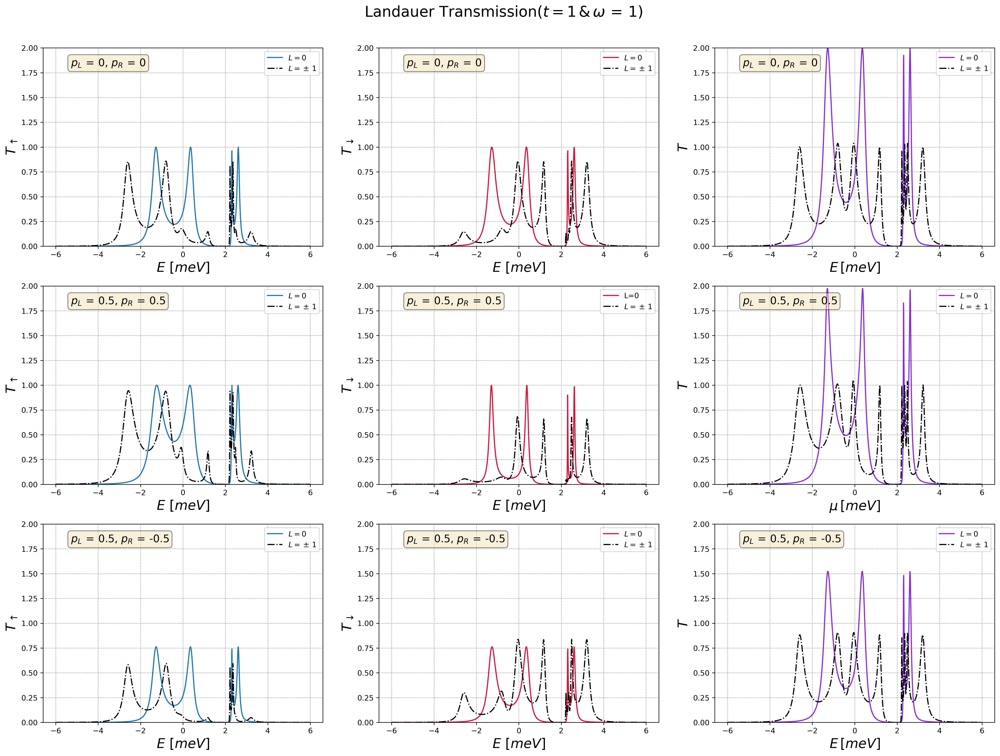

In [13]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('Reference.jpg')

## Case 1: $t=0.5$ and for different polarization configurations

Additional, we include the different polarization configurations

In [14]:
#Hopping parameters:

t = 0.5 #meV

### $L=\pm 0$ and for different polarization configurations

In [15]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0. +0.j -0. +0.j -0.5+0.j  0. +0.j]
 [-0. +0.j  0. +0.j  0. +0.j -0.5+0.j]
 [-0.5+0.j  0. +0.j -0. +0.j -0. +0.j]
 [ 0. +0.j -0.5+0.j -0. +0.j  0. +0.j]]


In [16]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [17]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [18]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [19]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1. +0.j  0. +1.j -0.5+0.j  0. +0.j]
 [-0. -1.j  1. +0.j  0. +0.j -0.5+0.j]
 [-0.5+0.j  0. +0.j -1. +0.j  0. +1.j]
 [ 0. +0.j -0.5+0.j -0. -1.j  1. +0.j]]


In [20]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [21]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [22]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


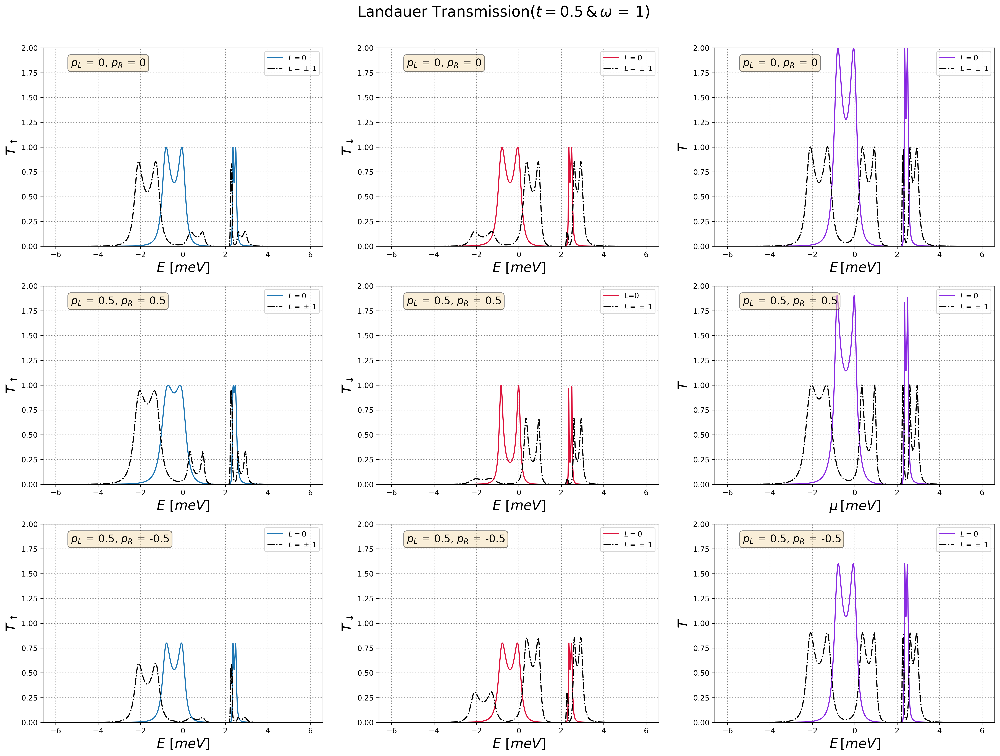

In [23]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_1.jpg')

## Case 2: $t=2$ and for different polarization configurations

Additional, we include the different polarization configurations

In [24]:
#Hopping parameters:

t = 2 #meV

### $L=\pm 0$ and for different polarization configurations

In [25]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -2.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -2.+0.j]
 [-2.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -2.+0.j -0.+0.j  0.+0.j]]


In [26]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [27]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [28]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [29]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -2.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -2.+0.j]
 [-2.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -2.+0.j -0.-1.j  1.+0.j]]


In [30]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [31]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [32]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


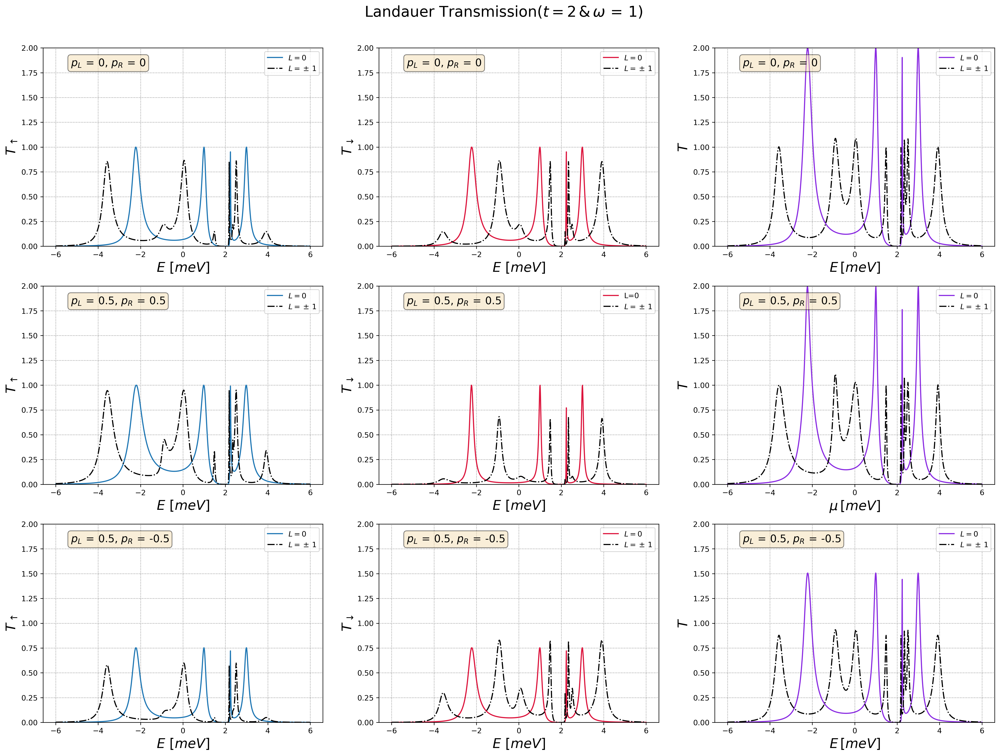

In [33]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_2.jpg')

## Case 3: $t=4$ and for different polarization configurations

Additional, we include the different polarization configurations

In [34]:
#Energy axis

energy_axis = np.arange(-15, 15 + 0.01, 0.01) #meV
print("Energy axis is", energy_axis,"meV")

#Hopping parameters:

t = 4 #meV

Energy axis is [-15.   -14.99 -14.98 ...  14.98  14.99  15.  ] meV


### $L=\pm 0$ and for different polarization configurations

In [35]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -4.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -4.+0.j]
 [-4.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -4.+0.j -0.+0.j  0.+0.j]]


In [36]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [37]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [38]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [39]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -4.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -4.+0.j]
 [-4.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -4.+0.j -0.-1.j  1.+0.j]]


In [40]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [41]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [42]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


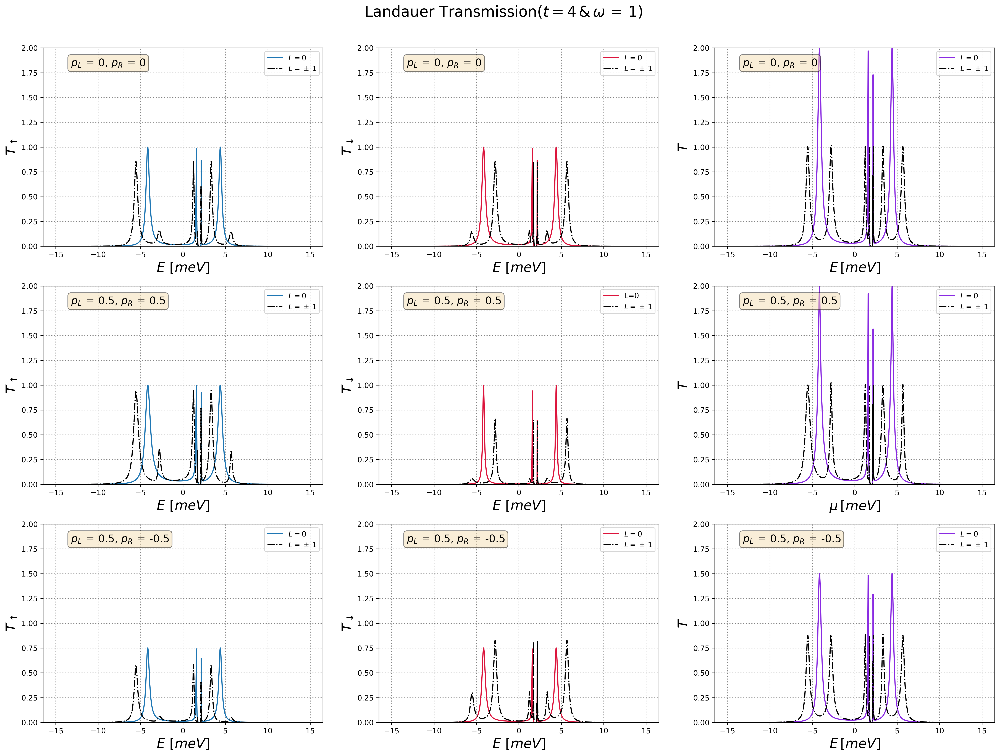

In [43]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_3.jpg')

# Varying the Hopping $\omega$:

**Fixed parameter**

$t\,=\,\,1\,meV$

In [44]:
#Energy axis

energy_axis = np.arange(-6, 6 + 0.01, 0.01) #meV
print("Energy axis is", energy_axis,"meV")

#Gamma i.e. width parameter
gamma = 1 #meV
print("The width is:",gamma,"meV")

#Site energies:
e_01 = 0 #meV
e_02 = 0 #meV
e_11 = 2 #meV
e_12 = 2 #meV

#Hopping parameter:
t = 1 #meV

# Helix geometric parameters:

lam_2 = 0.5 #meV

B = - 2



Energy axis is [-6.   -5.99 -5.98 ...  5.98  5.99  6.  ] meV
The width is: 1 meV


## Reference case ($\omega=0$):

Additional, we include the different polarization configurations

In [45]:
#Hopping parameter:

om = 0 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

### $L=\pm 0$ and for different polarization configurations

In [46]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [47]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [48]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [49]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [50]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [51]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [52]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [53]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


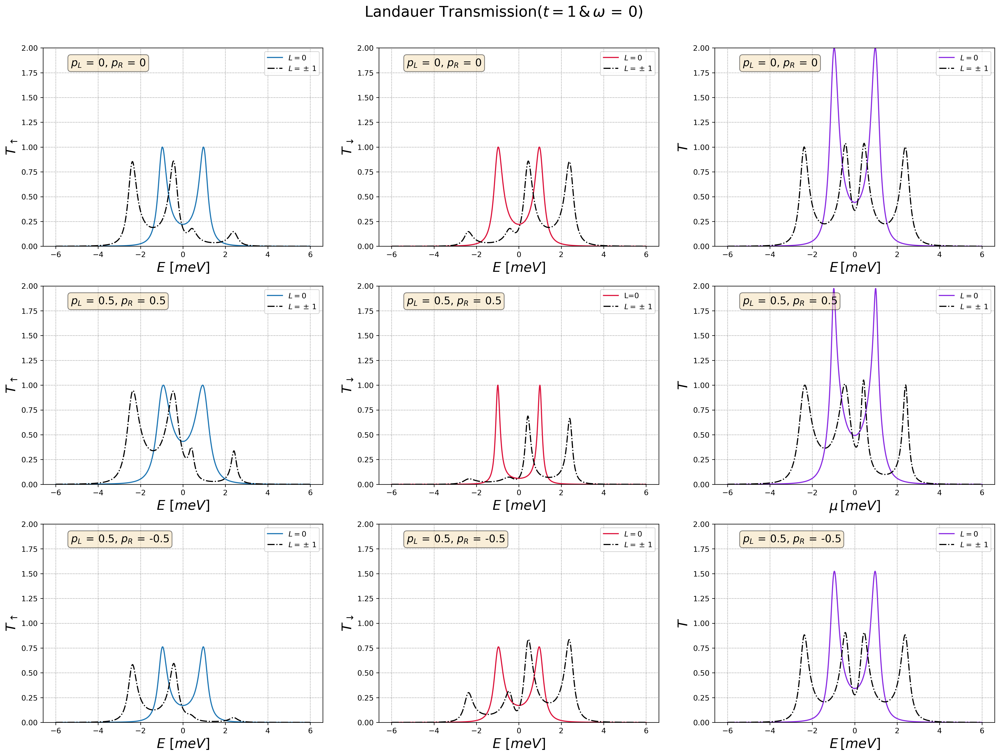

In [54]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_4.jpg')

## Case 2: $\omega=0.5$ and for different polarization configurations

Additional, we include the different polarization configurations

In [55]:
#Hopping parameter:

om = 0.5 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

### $L=\pm 0$ and for different polarization configurations

In [56]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [57]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [58]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [59]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [60]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [61]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [62]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [63]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


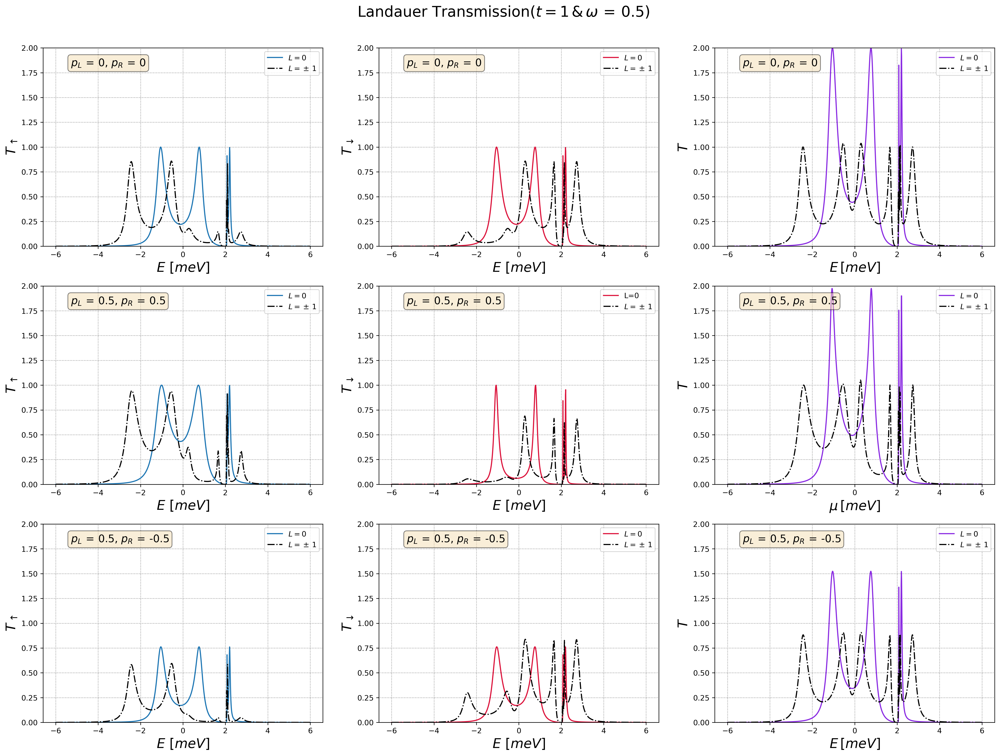

In [64]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_5.jpg')

## Case 3: $\omega=1$ and for different polarization configurations

Additional, we include the different polarization configurations

In [65]:
#Hopping parameter:

om = 1 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

### $L=\pm 0$ and for different polarization configurations

In [66]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [67]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [68]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [69]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [70]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [71]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [72]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [73]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


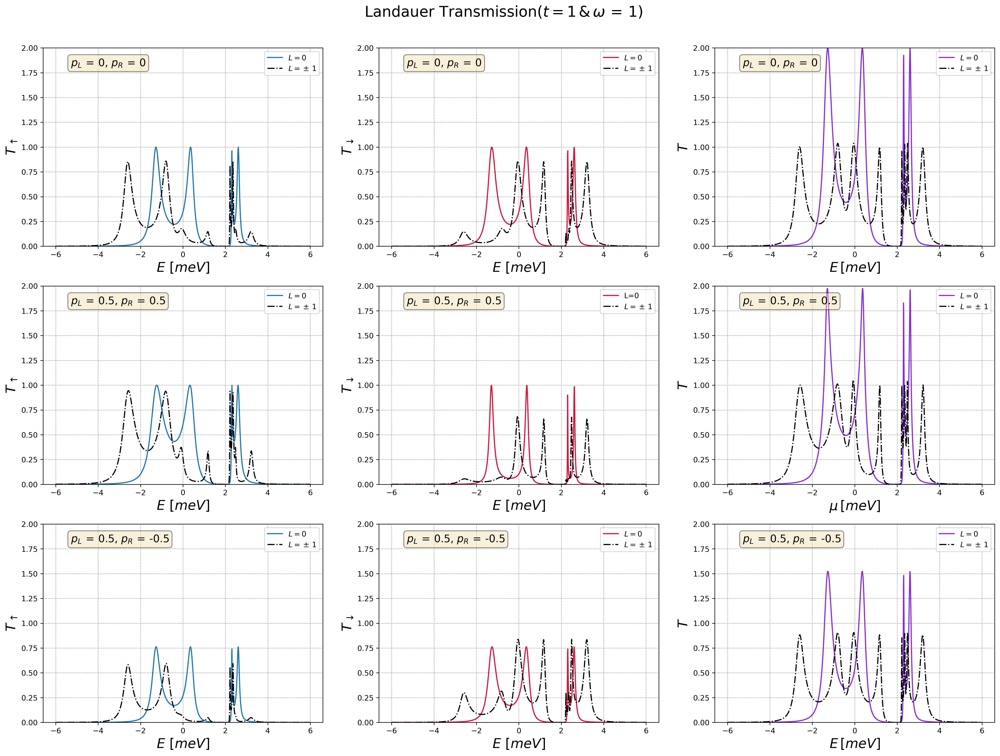

In [74]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_6.jpg')

## Case 4: $\omega=2$ and for different polarization configurations

Additional, we include the different polarization configurations

In [75]:
#Hopping parameter:

om = 2 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

### $L=\pm 0$ and for different polarization configurations

In [76]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [77]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [78]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [79]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [80]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [81]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [82]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [83]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


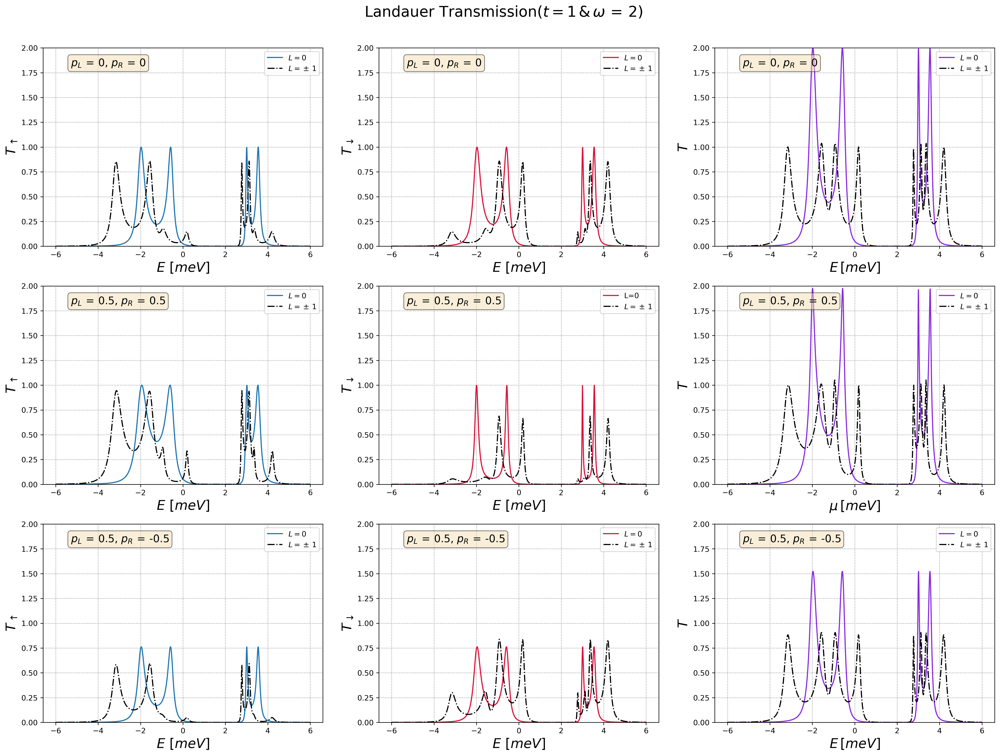

In [84]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_7.jpg')

## Case 4: $\omega=3$ and for different polarization configurations

Additional, we include the different polarization configurations

In [85]:
#Hopping parameter:

om = 3 #meV

#Renormalized site energies array:
e_ren_1 = np.array([e_01,e_11, om])

e_ren_2 = np.array([e_02, e_12, om])

# print("The site (spin independent) energies to be renormalized are:", \
#       e_ren_1," meV and",e_ren_2," meV")

### $L=\pm 0$ and for different polarization configurations

In [86]:
# Angular momentum:

L = 0

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-0.+0.j -0.+0.j -1.+0.j  0.+0.j]
 [-0.+0.j  0.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -0.+0.j -0.+0.j]
 [ 0.+0.j -1.+0.j -0.+0.j  0.+0.j]]


In [87]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [88]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [89]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_0 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


### $L=\pm 1$ and for different polarization configurations

In [90]:
# Angular momentum:

L = 1

e_ren_1_u = e_ren_1  #meV
e_ren_1_d = e_ren_1  #meV
e_ren_2_u = e_ren_2  #meV
e_ren_2_d = e_ren_2  #meV

site_energies = np.array([e_ren_1_u, e_ren_1_d , e_ren_2_u , e_ren_2_d], dtype = complex)
#print(site_energies)

Hamiltonian = np.array([[lam_2*L*B, -(1j)*lam_2*L*B,-t,0],[(1j)*lam_2*L*B, -lam_2*L*B, 0,-t],[-t,0,lam_2*L*B, -(1j)*lam_2*L*B],\
                        [0,-t, (1j)*lam_2*L*B, -lam_2*L*B]], dtype = complex)

print(Hamiltonian)

[[-1.+0.j  0.+1.j -1.+0.j  0.+0.j]
 [-0.-1.j  1.+0.j  0.+0.j -1.+0.j]
 [-1.+0.j  0.+0.j -1.+0.j  0.+1.j]
 [ 0.+0.j -1.+0.j -0.-1.j  1.+0.j]]


In [91]:
#POLARIZATION p_L = p_R = 0
p_L = 0
p_R = 0

#Transmission axis

transmission_u_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[0]
transmission_d_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L, p_R)[1]

In [92]:
#POLARIZATION UP-UP
p_L_1 = 0.5
p_R_1 = 0.5

#Transmission axis

transmission_u_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[0]
transmission_d_1_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_1, p_R_1)[1]


In [93]:
#POLARIZATION UP-DOWN
p_L_2 = 0.5
p_R_2 = -0.5

#Transmission axis

transmission_u_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[0]
transmission_d_2_L_1 = fy.Transmission(energy_axis, gamma, Hamiltonian, site_energies, p_L_2, p_R_2)[1]


/home/franklin/miniconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:128: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.


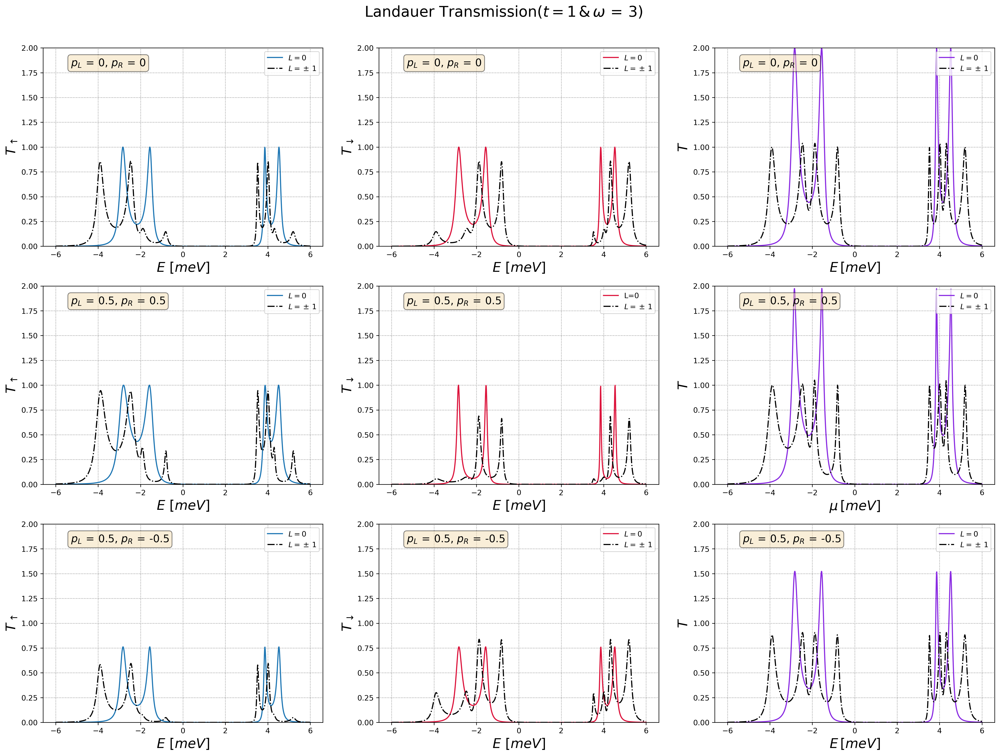

In [94]:
# do not forget constrained_layout=True to have some space between axes
fig = plt.figure(constrained_layout=True, figsize=(23, 16), dpi=300)

# these are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

#Set the grid for the subplots
gs = GridSpec(3, 3, figure=fig)

#Add the subplots
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])
ax7 = fig.add_subplot(gs[2, 0])
ax8 = fig.add_subplot(gs[2, 1])
ax9 = fig.add_subplot(gs[2, 2])

# 0 - 0
# Transmission UP Plot
ax1.grid(linestyle=':', color='grey')
ax1.plot(energy_axis, transmission_u_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax1.plot(energy_axis, transmission_u_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax1.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax1.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax1.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax1.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax1.legend( loc='upper right')

# Transmission DOWN Plot
ax2.grid(linestyle=':', color='grey')
ax2.plot(energy_axis, transmission_d_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax2.plot(energy_axis, transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax2.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax2.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax2.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax2.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax2.legend( loc='upper right')

# Total Transmission Plot
ax3.grid(linestyle=':', color='grey')
ax3.plot(energy_axis, transmission_u_L_0 + transmission_d_L_0, "#8A2BE2", label = r"$L=0$")
ax3.plot(energy_axis, transmission_u_L_1 + transmission_d_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax3.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax3.set_ylabel(r"$T$",fontsize=18)
ax3.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L)+", "r"$p_{R}\,=\,$"+str(p_R), transform=ax3.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax3.legend( loc='upper right')  

# UP - UP

ax4.grid(linestyle=':', color='grey')
ax4.plot(energy_axis, transmission_u_1_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax4.plot(energy_axis, transmission_u_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax4.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax4.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax4.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax4.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax4.legend( loc='upper right')

ax5.grid(linestyle=':', color='grey')
ax5.plot(energy_axis, transmission_d_1_L_0, "#DC143C", linestyle="-", label=r"L=0")
ax5.plot(energy_axis, transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax5.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax5.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax5.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax5.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax5.legend( loc='upper right')

ax6.grid(linestyle=':', color='grey')
ax6.plot(energy_axis, transmission_u_1_L_0 + transmission_d_1_L_0, "#8A2BE2", label=r"$L=0$")
ax6.plot(energy_axis, transmission_u_1_L_1 + transmission_d_1_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax6.set_xlabel(r'$\mu\,[meV]$',fontsize=18)
ax6.set_ylabel(r"$T$",fontsize=18)
ax6.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_1)+", "r"$p_{R}\,=\,$"+str(p_R_1), transform=ax6.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax6.legend( loc='upper right')

# UP - UP

ax7.grid(linestyle=':', color='grey')
ax7.plot(energy_axis, transmission_u_2_L_0, "#1f77b4", linestyle="-", label=r"$L=0$")
ax7.plot(energy_axis, transmission_u_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax7.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax7.set_ylabel(r'$T_{\uparrow}$',fontsize=18)
ax7.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax7.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax7.legend( loc='upper right')

#Seebeck no spin accumulation Plot
ax8.grid(linestyle=':', color='grey')
ax8.plot(energy_axis, transmission_d_2_L_0, "#DC143C", linestyle="-", label=r"$L=0$")
ax8.plot(energy_axis, transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax8.set_xlabel(r'$E\,\,[meV]$',fontsize=18)
ax8.set_ylabel(r'$T_{\downarrow}$',fontsize=18)
ax8.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax8.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax8.legend( loc='upper right')

#Seebeck spin accumulation Plot:
ax9.grid(linestyle=':', color='grey')
ax9.plot(energy_axis, transmission_u_2_L_0 + transmission_d_2_L_0, "#8A2BE2", label=r"$L=0$")
ax9.plot(energy_axis, transmission_u_2_L_1 + transmission_d_2_L_1, "#000000", linestyle="-.", label=r"$L=\pm\,1$")
ax9.set_xlabel(r'$E\,[meV]$',fontsize=18)
ax9.set_ylabel(r"$T$",fontsize=18)
ax9.text(0.1, 0.95, r"$p_{L}\,=\,$"+str(p_L_2)+", "r"$p_{R}\,=\,$"+str(p_R_2), transform=ax9.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
ax9.legend( loc='upper right')

# Stablish limits for the subplots
ax1.set_ylim(0, 2)  
ax2.set_ylim(0, 2)   
ax3.set_ylim(0, 2)  
ax4.set_ylim(0, 2)  
ax5.set_ylim(0, 2)   
ax6.set_ylim(0, 2)  
ax7.set_ylim(0, 2)  
ax8.set_ylim(0, 2)   
ax9.set_ylim(0, 2)  


# Ajustar el diseño y mostrar los subplots
plt.suptitle("Landauer Transmission"+r"($t=$"+str(t)+r"$\,&\,\omega\,=\,$"+str(om)+")", fontsize=20, y=0.95)

# Ajustar el espacio superior
plt.subplots_adjust(top=0.9)

#plt.tight_layout()

plt.show()

fig.savefig('transmission_8.jpg')